In [35]:
import os
from copy import deepcopy
from glob import glob
from warnings import simplefilter
from typing import List, Callable

In [2]:
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=UserWarning)

#### Configure path parameters and read data files

In [3]:
ROOT_DIR = os.path.abspath(os.path.join(os.getcwd(), *['..'] * 1)) 
IMAGES_DIR = os.path.join(ROOT_DIR, "data", "datasets", "aircraft", "images")

In [45]:
images_dir = IMAGES_DIR
labels_fp = os.path.join(ROOT_DIR, "data", "datasets", "aircraft", "annotations.csv")

#### Load utility functions

In [5]:
os.chdir(ROOT_DIR)

In [6]:
import torch
import shapely.wkt
import torch.nn as nn
import pandas as pd
import numpy as np
import albumentations as A
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from shapely.geometry import MultiPolygon
from albumentations.pytorch import ToTensorV2
from PIL import Image

from src.utilities.plotting.draw_bounding_boxes import draw_bounding_boxes, bounds_from_geometry

Recall the structure of our images and labels.

The images are each `.jpg` files with a unique identifier. The labels are in a `.csv` file with the following structure:

```
id, image_id, geometry, class
```

Each image can have multiple rows in the labels file, one for each `Airplane` or `Truncated_aircraft` in the image. The `geometry` column contains the polygon bounds of the item referenced by the label, in pixel coordinates.

In [7]:
df_labels = pd.read_csv(labels_fp, converters={'geometry':lambda x:list(eval(x))})  # parse the list of tuples from string literal

In [8]:
df_labels

,id,image_id,geometry,class
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane
...,...,...,...,...
3420,3421,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1059, 393), (1187, 393), (1187, 522), (1059,...",Airplane
3421,3422,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(932, 355), (1028, 355), (1028, 461), (932, 4...",Airplane
3422,3423,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(2461, 244), (2560, 244), (2560, 345), (2461,...",Truncated_airplane
3423,3424,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1820, 344), (1937, 344), (1937, 443), (1820,...",Airplane


Note that the `geometry` are polygons rather than bounding boxes.

In [9]:
df_labels.iloc[0]["geometry"]

[(135, 522), (245, 522), (245, 600), (135, 600), (135, 522)]

#### Building a `torch.Dataloader` for the dataset

We have a dataset of images and labels. We will build a `torch.Dataloader` to load the data in batches, optionally with transformations applied to the images.

This is a common pattern in PyTorch, and is useful for training models on large datasets. In our case, the dataset is quite small (at least for now!), but we will still use a `torch.Dataloader` to demonstrate the pattern.

In [110]:
class AircraftDataset(Dataset):
  """
  Custom Dataset class for the Aircraft Images dataset.
  """

  def __init__(self, image_dir: str, labels_fp: str, transformations: List[Callable] = None):
    """
    Initializes the dataset.

    Args:
      image_dir: The path to the directory containing the images
      labels_fp: The filepath to the CSV file containing labels and geometry info.
      transformations: A list of transformations to apply to the images and geometry.
    """
    if not transformations:
      transformations = A.Compose([
        ToTensorV2(),
      ])
    self.image_filepaths = list(sorted(glob(os.path.join(image_dir, "*.jpg"))))  # get all files with the .jpg extension
    self.labels_df = pd.read_csv(labels_fp, converters={'geometry':lambda x:list(eval(x))})  # parse the list of tuples from string literal
    self.transformations = transformations

    # Create a mapping from image filename to index for efficient lookup
    self.filename_to_index = {os.path.basename(fp): i for i, fp in enumerate(self.image_filepaths)}

  def __len__(self):
    """
    Returns the total number of samples in the dataset.
    """
    return len(self.image_filepaths)

  def __getitem__(self, idx):
    """
    Loads and returns a sample from the dataset at the given index.
    """
    img_path = self.image_filepaths[idx]
    img_name = os.path.basename(img_path)

    # Load image
    image = Image.open(img_path).convert("RGB")

    # Get count of aircraft for the current image
    annotations = self.labels_df[(self.labels_df['image_id'] == img_name) & (self.labels_df['class'] == "Airplane")]
    count = len(annotations)

    # Convert count to a PyTorch tensor
    count = torch.tensor(count, dtype=torch.float32)  # Use float for regression

    # Convert PIL Image to NumPy array
    image = np.array(image)

    # Apply transformations if any
    if self.transformations:
      image = self.transformations(image=image)['image']

    return image, count


In [111]:
def collate_fn(batch):
  """The collation function for batching in the DataLoader"""
  images, counts = zip(*batch)
  images = torch.stack(images, dim=0)
  counts = torch.stack(counts, dim=0)
  return images, counts

def get_dataloader(
  image_filepaths: list,
  labels_fp: str,
  transformations: transforms.Compose = None,
  batch_size: int = 8,
  shuffle: bool = True,
  num_workers: int = 2
) -> torch.utils.data.DataLoader:
  """
  Creates and returns a PyTorch DataLoader for the Aircraft Count dataset.

  Args:
    image_filepaths: A list of filepaths to the images.
    labels_fp: The filepath to the CSV file containing labels (counts).
    transformations: A list of callable transformations (e.g., from Albumentations).
    batch_size: The number of samples per batch.
    shuffle: Whether to shuffle the dataset.
    num_workers: The number of subprocesses to use for data loading.

  Returns:
    A PyTorch DataLoader.
  """

  dataset = AircraftDataset(image_filepaths, labels_fp, transformations)

  dataloader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=shuffle,
    num_workers=num_workers,
    collate_fn=collate_fn
  )

  return dataloader


We can try creating a `torch.Dataloader` with a batch size of 1, and no transformations.

In [112]:
# Create the DataLoader
dataloader = get_dataloader(images_dir, labels_fp, [], batch_size=1, num_workers=1)

To sanity check, with a batch size of 1 it has the same number of batches as the number of images in the dataset.

In [113]:
len(dataloader)

103

In [ ]:
for images, targets in dataloader:
    print("Image batch shape:", images.shape)
    print("Targets:", targets)
    break  # Just print the first batch for demonstration

Image batch shape: torch.Size([1, 3, 2560, 2560])
Targets: tensor([31.])


In this case, we can see that the image is a 3-channel image with a height and width of 2560 pixels.

We also see that there are 31 labels for this image, with the `class` column indicating whether the label is for an `Airplane`.

#### Building a simple CNN using `torch.nn.Module`

In [115]:
class SimpleCNN(nn.Module):
  def __init__(self):
    super(SimpleCNN, self).__init__()
    self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
    self.relu1 = nn.ReLU()
    self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
    self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
    self.relu2 = nn.ReLU()
    self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
    self.fc1 = nn.Linear(32 * 64 * 64, 128)
    self.relu3 = nn.ReLU()
    self.fc2 = nn.Linear(128, 1)

  def forward(self, x):
    # Apply two pooling layers
    x = self.pool1(self.relu1(self.conv1(x)))
    x = self.pool2(self.relu2(self.conv2(x)))

    x = x.view(-1, 32 * 64 * 64)  # Flatten after pooling

    x = self.relu3(self.fc1(x))  # Apply a nonlinearity
    x = self.fc2(x)  # Generate a regression prediction for the Airplane count in the input

    return x

#### Training the model

In [116]:
# Basic hyperparameters
learning_rate = 1e-3
num_epochs = 10
batch_size = 1

In order to effectively train the model, we need to define some basic transformations to apply to the images.

There are many, many more transformations available in PyTorch, but these are some of the most common.

In [117]:
transformations = A.Compose([
  A.Resize(256, 256),  # This transform resizes each image before subsequent processing
  A.HorizontalFlip(p=0.5),  # This transform flips images horizontally with a 50% probability
  A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # This transformation normalizes from standard RGB to grayscale
  ToTensorV2(),  # This transform maps our image to a torch.Tensor object
])


In [118]:
# Create the DataLoader
dataloader = get_dataloader(images_dir, labels_fp, transformations, batch_size=batch_size, num_workers=1)

In [ ]:
model = SimpleCNN()
criterion = nn.MSELoss()  # Mean Squared Error for regression
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
  for i, (images, targets) in enumerate(dataloader):
    if i == len(dataloader) - 1: continue  # save the last batch for demonstration
    # Forward pass
    outputs = model(images)
    loss = criterion(outputs.squeeze(), targets)  # Ensure outputs are squeezed to match counts shape

    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")


Epoch [1/10], Loss: 24.1868
Epoch [2/10], Loss: 5.9606
Epoch [3/10], Loss: 17.7519
Epoch [4/10], Loss: 3.6949
Epoch [5/10], Loss: 1.1652
Epoch [6/10], Loss: 5.1840
Epoch [7/10], Loss: 100.2603
Epoch [8/10], Loss: 38.0973
Epoch [9/10], Loss: 19.8020
Epoch [10/10], Loss: 0.2461


Check the model's prediction on the last batch in the DataLoader.

In [122]:
for i, (last_images, targets) in enumerate(dataloader):
  if i < len(dataloader) - 1: continue  # examine the predictions for the last batch in the dataset
  predicted_counts = model(last_images)

In [123]:
predicted_counts

tensor([[8.6095]], grad_fn=<AddmmBackward0>)

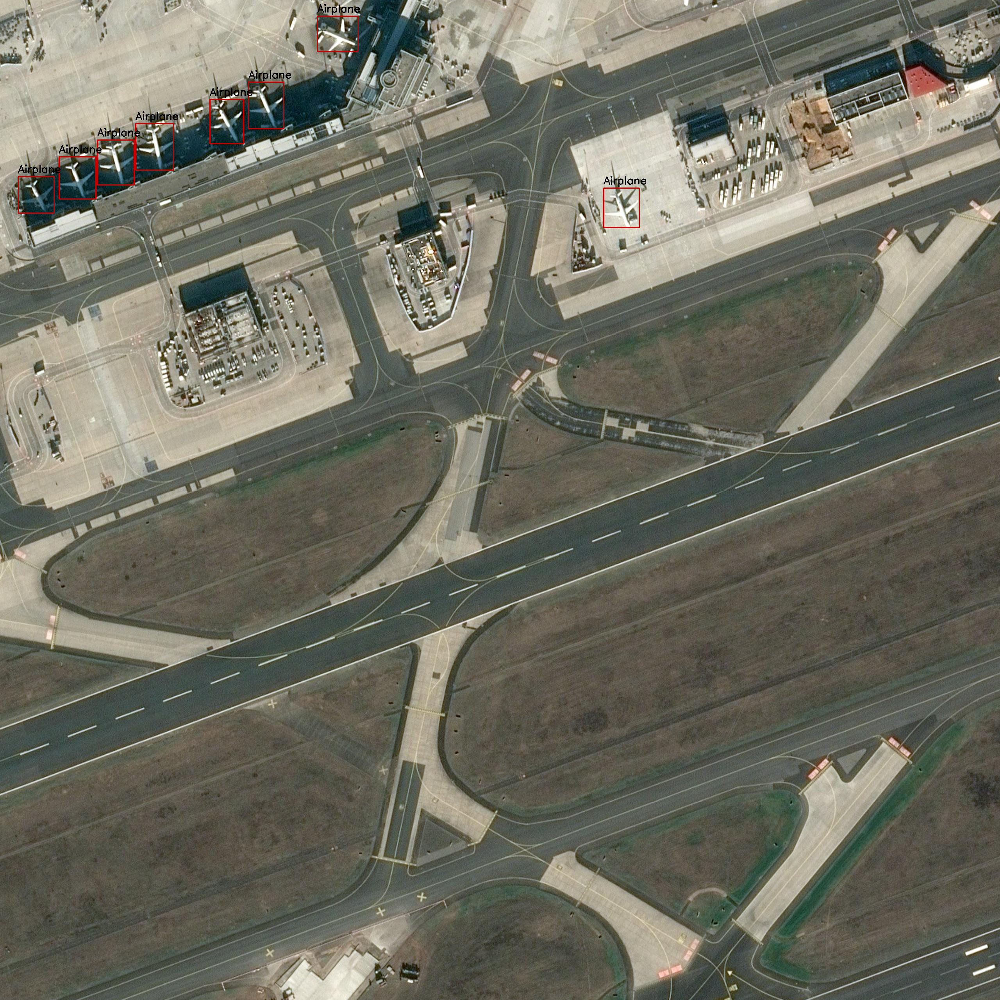

In [125]:
# We can print the last image with bounding boxes to estimate the prediction quality
images = glob(os.path.join(IMAGES_DIR, "*.jpg"))
sampled_image_fp = sorted(images)[-1]
draw_bounding_boxes(sampled_image_fp, df_labels)